# YOLOv3 Object Detection

In [1]:
import warnings
warnings.filterwarnings('ignore')

# Google Drive Mount


In [2]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


* 마운트 결과 확인

In [3]:
!ls -l '/content/drive/My Drive/Colab Notebooks/datasets/testImage.jpeg'

-r-------- 1 root root 160514 Mar  9 09:00 '/content/drive/My Drive/Colab Notebooks/datasets/testImage.jpeg'


In [4]:
!ls -l '/content/drive/My Drive/Colab Notebooks/datasets/testVideo.mp4'

-r-------- 1 root root 8981976 Mar 30 06:11 '/content/drive/My Drive/Colab Notebooks/datasets/testVideo.mp4'


# I. YOLOv3 Weight Download

## 1) 'yolov3.weights' 


In [5]:
from urllib.request import urlretrieve

urlretrieve('https://pjreddie.com/media/files/yolov3.weights','yolov3.weights')

('yolov3.weights', <http.client.HTTPMessage at 0x7fe9928e0b50>)

## 2) 'yolov3-tiny.weights'

In [6]:
from urllib.request import urlretrieve

urlretrieve('https://pjreddie.com/media/files/yolov3-tiny.weights','yolov3-tiny.weights')

('yolov3-tiny.weights', <http.client.HTTPMessage at 0x7fe992250a10>)

# II. darknet Clone

* yolov3.cfg
* yolov3-tiny.cfg
* coco.names

In [7]:
!git clone https://github.com/pjreddie/darknet.git

Cloning into 'darknet'...
remote: Enumerating objects: 5946, done.
remote: Total 5946 (delta 0), reused 0 (delta 0), pack-reused 5946
Receiving objects: 100% (5946/5946), 6.37 MiB | 9.24 MiB/s, done.
Resolving deltas: 100% (3927/3927), done.


## 1) 'yolov3.cfg'

In [8]:
!cat darknet/cfg/yolov3.cfg

[net]
# Testing
# batch=1
# subdivisions=1
# Training
batch=64
subdivisions=16
width=608
height=608
channels=3
momentum=0.9
decay=0.0005
angle=0
saturation = 1.5
exposure = 1.5
hue=.1

learning_rate=0.001
burn_in=1000
max_batches = 500200
policy=steps
steps=400000,450000
scales=.1,.1

[convolutional]
batch_normalize=1
filters=32
size=3
stride=1
pad=1
activation=leaky

# Downsample

[convolutional]
batch_normalize=1
filters=64
size=3
stride=2
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=32
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=64
size=3
stride=1
pad=1
activation=leaky

[shortcut]
from=-3
activation=linear

# Downsample

[convolutional]
batch_normalize=1
filters=128
size=3
stride=2
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=leaky

[shortcut]
from=-3
activation=linear

[convolutiona

## 2) 'yolov3-tiny.cfg'

In [9]:
!cat darknet/cfg/yolov3-tiny.cfg

[net]
# Testing
batch=1
subdivisions=1
# Training
# batch=64
# subdivisions=2
width=416
height=416
channels=3
momentum=0.9
decay=0.0005
angle=0
saturation = 1.5
exposure = 1.5
hue=.1

learning_rate=0.001
burn_in=1000
max_batches = 500200
policy=steps
steps=400000,450000
scales=.1,.1

[convolutional]
batch_normalize=1
filters=16
size=3
stride=1
pad=1
activation=leaky

[maxpool]
size=2
stride=2

[convolutional]
batch_normalize=1
filters=32
size=3
stride=1
pad=1
activation=leaky

[maxpool]
size=2
stride=2

[convolutional]
batch_normalize=1
filters=64
size=3
stride=1
pad=1
activation=leaky

[maxpool]
size=2
stride=2

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=leaky

[maxpool]
size=2
stride=2

[convolutional]
batch_normalize=1
filters=256
size=3
stride=1
pad=1
activation=leaky

[maxpool]
size=2
stride=2

[convolutional]
batch_normalize=1
filters=512
size=3
stride=1
pad=1
activation=leaky

[maxpool]
size=2
stride=1

[convolutional]
batch_normalize=1
filter

## 3) 'coco.names'

* 80가지 객체

In [10]:
!cat darknet/data/coco.names

person
bicycle
car
motorbike
aeroplane
bus
train
truck
boat
traffic light
fire hydrant
stop sign
parking meter
bench
bird
cat
dog
horse
sheep
cow
elephant
bear
zebra
giraffe
backpack
umbrella
handbag
tie
suitcase
frisbee
skis
snowboard
sports ball
kite
baseball bat
baseball glove
skateboard
surfboard
tennis racket
bottle
wine glass
cup
fork
knife
spoon
bowl
banana
apple
sandwich
orange
broccoli
carrot
hot dog
pizza
donut
cake
chair
sofa
pottedplant
bed
diningtable
toilet
tvmonitor
laptop
mouse
remote
keyboard
cell phone
microwave
oven
toaster
sink
refrigerator
book
clock
vase
scissors
teddy bear
hair drier
toothbrush


# III. Image

## 1) Import Packages

In [11]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

* OpenCV 버전 확인

In [12]:
cv2.__version__

'4.1.2'

## 2) 'Detection' 최소 신뢰도(확률) 지정

In [13]:
min_confidence = 0.5

## 3) Load YOLOv3

In [14]:
net = cv2.dnn.readNet('yolov3.weights', 'darknet/cfg/yolov3.cfg')
# net = cv2.dnn.readNet('yolov3-tiny.weights', 'darknet/cfg/yolov3-tiny.cfg')

# Detection된 Object(Class) List 배열 정의
classes = []   

# 80개의 Object(class)를 구분할 수 있는 Object의 이름을 classes 배열에 넣어준다.
with open('darknet/data/coco.names', 'r') as f:
   classes = [line.strip() for line in f.readlines()]   

layer_names = net.getLayerNames()

output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]

# Object 마다 컬러를 하나씩 다르게 지정
colors = np.random.uniform(0, 255, size=(len(classes), 3))  

## 4) 원본 Image

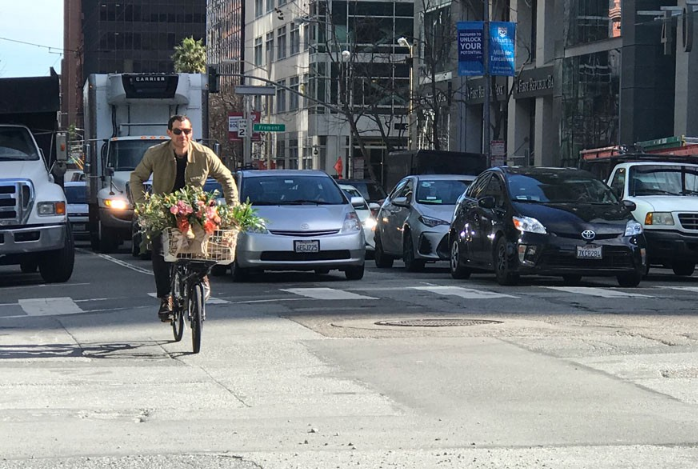

In [15]:
img = cv2.imread('/content/drive/My Drive/Colab Notebooks/datasets/testImage.jpeg')
img = cv2.resize(img, None, fx = 0.8, fy = 0.8)

height, width, channels = img.shape

cv2_imshow(img)

## 5) Image Object Detection

* Object Detection

In [16]:
blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop = False)

net.setInput(blob)

outs = net.forward(output_layers)  

* Showing Informations

In [17]:
class_ids = []     # Detection Class_ID 저장
confidences = []   # Detection Class_신뢰도(확률) 저장
boxes = []         # Detection Boxing_정보 저장

for out in outs:
    for detection in out:
        scores = detection[5:]
        class_id = np.argmax(scores)    # Detected Class_ID
        confidence = scores[class_id]   # Detected Class_신뢰도(확률)

        if confidence > min_confidence:  
            # Object Detected
            center_x = int(detection[0] * width)
            center_y = int(detection[1] * height)
            w = int(detection[2] * width)
            h = int(detection[3] * height)

            # Rectangle Coordinates
            x = int(center_x - w / 2)
            y = int(center_y - h / 2)

            boxes.append([x, y, w, h])             # Boxing_정보 추가
            confidences.append(float(confidence))  # 신뢰도(확률) 추가
            class_ids.append(class_id)             # Class_ID 추가

3 car
4 car
5 person
6 car
7 car
8 car
9 car
10 bicycle


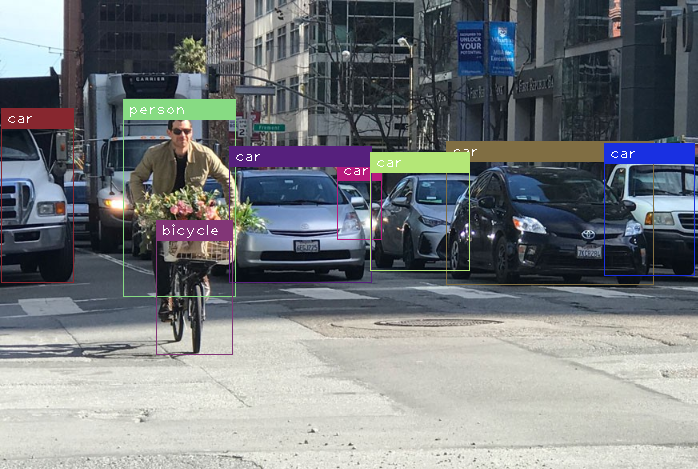

In [18]:
indexes = cv2.dnn.NMSBoxes(boxes, confidences, min_confidence, 0.4)

font = cv2.FONT_HERSHEY_PLAIN

for i in range(len(boxes)):
    if i in indexes:    
        x, y, w, h = boxes[i]
        label = str(classes[class_ids[i]]) 
        print(i, label)
        color = colors[i]
        cv2.rectangle(img, (x, y), (x + w, y + h), color, 1)
        cv2.rectangle(img, (x, y - 20), (x + w, y), color, -1)
        cv2.putText(img, label, (x + 5, y - 5), font, 1, (255, 255, 255), 1)

cv2_imshow(img)

# IV. Video

## 1) Import Packages

In [19]:
import cv2
import numpy as np
import time
import io
import base64
from IPython.display import HTML

## 2) 원본 Video

In [20]:
video = io.open('/content/drive/My Drive/Colab Notebooks/datasets/testVideo.mp4', 'r+b').read()

encoded = base64.b64encode(video)

HTML(data='''<video width="70%" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4"/>
             </video>'''.format(encoded.decode('ascii')))

## 3) 탐색 정보

In [21]:
file_name = '/content/drive/My Drive/Colab Notebooks/datasets/testVideo.mp4'

min_confidence = 0.5   

output_name = 'testVideo_output.mp4' 

elapsed_time = 0       

In [22]:
def detectAndDisplay(frame):
    start_time = time.time()
    img = cv2.resize(frame, None, fx = 0.8, fy = 0.8)
    height, width, channels = img.shape

    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)

    net.setInput(blob)
    outs = net.forward(output_layers)

    # Showing Informations
    class_ids = []      # Class_ID 저장
    confidences = []    # Class_신뢰도(확률) 저장
    boxes = []          # Boxing_정보 저장

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)      # Detected Class_ID
            confidence = scores[class_id]     # Detected Class_신뢰도(확률)
            if confidence > min_confidence:
                
                # Object Detected
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                # Rectangle Coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])             # Boxing_정보 추가
                confidences.append(float(confidence))  # 신뢰도(확률) 추가
                class_ids.append(class_id)             # Class_ID 추가
    
    indexes = cv2.dnn.NMSBoxes(boxes, confidences, min_confidence, 0.4)    
    font = cv2.FONT_HERSHEY_PLAIN
    for i in range(len(boxes)):
        if i in indexes:    
            x, y, w, h = boxes[i]
            label = "{}: {:.2f}".format(classes[class_ids[i]], confidences[i]*100)    
            print(i, label)
            color = colors[1] ###
            cv2.rectangle(img, (x, y), (x + w, y + h), color, 1)
            cv2.rectangle(img, (x, y - 20), (x + w, y), color, -1)
            cv2.putText(img, label, (x + 5, y - 5), font, 1, (255, 255, 255), 1)
    process_time = time.time() - start_time
    global elapsed_time
    elapsed_time += process_time   
    print("=== A frame took {:.3f} seconds".format(process_time))

    # 결과 Video 저장
    global writer
    if writer is None and output_name is not None:
        fourcc = cv2.VideoWriter_fourcc(*"MJPG")
        writer = cv2.VideoWriter(output_name, fourcc, 30,
                (img.shape[1], img.shape[0]), True)

    if writer is not None:
        writer.write(img)

## 4) Load YOLOv3

* 약 10분

In [23]:
net = cv2.dnn.readNet('yolov3.weights', 'darknet/cfg/yolov3.cfg')  

classes = []  

with open('darknet/data/coco.names', 'r') as f:
    classes = [line.strip() for line in f.readlines()]
layer_names = net.getLayerNames()
output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]
# colors = np.random.uniform(0, 255, size=(len(classes), 3))  

cap = cv2.VideoCapture(file_name)
writer = None
if not cap.isOpened:
    print('--(!)Error opening video capture')
    exit(0)
while True:
    ret, frame = cap.read()
    if frame is None:
        
        cap.release()
        
        writer.release()
        print('--(!) No captured frame -- Break!')
        print("elapsed time {:.3f} seconds".format(elapsed_time))
        break
    detectAndDisplay(frame)

0 person: 99.92
1 motorbike: 99.75
2 person: 86.07
3 person: 94.98
4 person: 81.27
5 person: 96.38
6 car: 93.31
=== A frame took 3.425 seconds
0 person: 99.86
1 motorbike: 99.68
2 person: 95.58
3 person: 89.00
4 person: 90.57
5 person: 94.82
6 car: 68.95
=== A frame took 2.139 seconds
0 person: 99.84
1 motorbike: 99.65
2 person: 60.18
3 person: 94.83
4 person: 83.50
5 person: 90.99
6 person: 98.18
7 car: 66.47
=== A frame took 2.139 seconds
0 person: 99.75
1 motorbike: 99.37
2 person: 50.01
3 person: 90.04
4 person: 83.96
5 person: 92.91
6 person: 94.52
7 car: 54.21
=== A frame took 2.177 seconds
0 person: 99.43
1 motorbike: 99.16
2 person: 60.35
3 person: 96.69
4 person: 52.02
5 car: 52.88
=== A frame took 2.496 seconds
0 person: 99.77
1 motorbike: 99.12
2 person: 53.52
3 person: 69.81
4 person: 81.64
5 person: 95.77
6 person: 81.73
=== A frame took 2.155 seconds
0 person: 99.90
1 motorbike: 98.60
2 person: 79.65
3 person: 71.83
4 person: 96.52
5 person: 90.99
=== A frame took 2.164 s

## 5) 결과 Video 다운로드

In [24]:
from google.colab import files

files.download('testVideo_output.mp4')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 
# 
# 
# The End
# 
# 
# 